![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Healthcare/30.NLP_Model_Testing.ipynb)

# Automated Bias, Robustness, and Data Quality Testing for NLP Models

# Setup

In [ ]:
import json
import os

from google.colab import files

license_keys = files.upload()

with open(list(license_keys.keys())[0]) as f:
    license_keys = json.load(f)

# Defining license key-value pairs as local variables
locals().update(license_keys)

# Adding license key-value pairs to environment variables
os.environ.update(license_keys)

In [ ]:
license_keys.keys()

dict_keys(['SPARK_OCR_LICENSE', 'SPARK_OCR_SECRET', 'OCR_VERSION', 'SPARK_NLP_LICENSE', 'SECRET', 'JSL_VERSION', 'PUBLIC_VERSION', 'AWS_ACCESS_KEY_ID', 'AWS_SECRET_ACCESS_KEY'])

In [ ]:
license_keys['JSL_VERSION']

'4.2.2'

In [ ]:
license_keys['PUBLIC_VERSION']

'4.2.2'

In [ ]:
# Installing pyspark and spark-nlp
! pip install --upgrade -q pyspark==3.1.2 spark-nlp==$PUBLIC_VERSION

# Installing Spark NLP Healthcare
! pip install --upgrade -q spark-nlp-jsl==$JSL_VERSION  --extra-index-url https://pypi.johnsnowlabs.com/$SECRET

# Installing WordNet library
! pip install -q wn

     |████████████████████████████████| 212.4 MB 58 kB/s 
     |████████████████████████████████| 643 kB 52.0 MB/s 
     |████████████████████████████████| 198 kB 52.5 MB/s 
     |████████████████████████████████| 331 kB 3.6 MB/s 


In [ ]:
import json
import os

import sparknlp
import sparknlp_jsl

from sparknlp.base import *
from sparknlp.annotator import *
from sparknlp_jsl.annotator import *

from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.ml import Pipeline,PipelineModel

import pandas as pd
pd.set_option('display.max_colwidth', 200)

import warnings
warnings.filterwarnings('ignore')

params = {"spark.driver.memory":"16G", 
          "spark.kryoserializer.buffer.max":"2000M", 
          "spark.driver.maxResultSize":"2000M"} 

print("Spark NLP Version :", sparknlp.version())
print("Spark NLP_JSL Version :", sparknlp_jsl.version())

spark = sparknlp_jsl.start(license_keys['SECRET'],params=params)

spark

Spark NLP Version : 4.2.2
Spark NLP_JSL Version : 4.2.2


# Data Preparation: Splitting CoNLL

In [ ]:
import random

def split_conll(conll_path, test_size: float):
  with open(conll_path) as f:
    content = f.read()
    sentences = content.split('\n\n')
    sentences = [sent.strip() for sent in sentences]
    random.shuffle(sentences)
    num_test_sample = int(len(sentences)*test_size)
    test_sentences = sentences[:num_test_sample]
    train_sentences = sentences[num_test_sample:]
  
  print(len(sentences), len(train_sentences), len(test_sentences))
  return train_sentences, test_sentences

def get_sample_sentences(sentences, sample_count):
  random.shuffle(sentences)
  return sentences[:sample_count]
  
def save_conll(sentences, save_path):
  with open(save_path, 'w') as f:
    content = "\n\n".join(sentences)
    f.write(content)

# Test type, strategy
# Robustness, tests applied to small subset of test set, fixes applied to training set 
# Gender Bias, tests applied to traninig set and test set
# Noisy Labels, testing and fixing applied on the whole dataset

train_sentences, test_sentences = split_conll('medical_data.conll', 0.3)

save_conll(train_sentences, 'medical_data_train.conll')
save_conll(test_sentences, 'medical_data_test.conll')

16316 11422 4894


# Robustness

Model robustness can be described as the ability of a model to keep similar levels of accuracy, precision and recall when subtle perturbations are made to the data it is predicting on. In the case of NER, the goal is to understand how documents with typos or uppercased letters affect the model's prediction performance compared to documents similar to those in the original training set.

## Robustness Testing

Testing a NER model's robustness is a mandatory step for making informed decisions on how to make it more robust.

### Pipeline Model for Robustness Test

Testing robustness first requires building a pipeline with a NER model that will be tested for robustness. This model should ideally not have been trained on the samples in the test set. We are using a pretrained model here for demo purposes, but it is more common to use a locally trained model.

In [ ]:
documentAssembler = DocumentAssembler()\
		.setInputCol("text")\
		.setOutputCol("sentence")

tokenizer = Tokenizer()\
		.setInputCols(["sentence"])\
		.setOutputCol("token")
	
embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models")\
		.setInputCols(["sentence", "token"])\
		.setOutputCol("embeddings")

ner = MedicalNerModel.pretrained("ner_clinical", "en", "clinical/models") \
		.setInputCols(["sentence", "token", "embeddings"]) \
		.setOutputCol("ner")

### You can also run tests on transformers-based NER models, make sure to skip the embeddings stage
# ner = MedicalBertForTokenClassifier.pretrained("bert_token_classifier_ner_clinical", "en", "clinical/models")\
#     .setInputCols("token", "sentence")\
#     .setOutputCol("ner")\
#     .setCaseSensitive(True)

ner_pipeline = Pipeline().setStages([
				documentAssembler,
				tokenizer,
				embeddings,
				ner
    ])

ner_model = ner_pipeline.fit(spark.createDataFrame([[""]]).toDF("text"))

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
ner_clinical download started this may take some time.
[OK!]


### Robustness Test Parameters & Perturbations

This function tests the robustness of a NER model by applying different types of perturbations to a list of sentences taken from a test dataset. Metrics are calculated by comparing the model's extractions in the original list of sentences against the extractions carried out in the noisy list of sentences. The original annotated labels are not used at any point, we are simply comparing the model against itself in a 2 settings.
<br/>

Here is a list of the different parameters that can be passed to the `test_robustness` function:

| Parameter  | Description |  |
| - | - | - |
|**spark**      |An active spark session.|
|**pipeline_model** |PipelineModel with document assembler, sentence detector, tokenizer, <br/>word embeddings (if applicable), NER model with _"ner"_ output label name, <br/> and NER converter with _"ner_chunk"_ output label name.|
|**conll_test_path**     |Path to CoNLL data for testing robustness. Sentences will be extracted for <br/> testing purposes.|
|**test** *      |List of robustness tests to implement. Possible values described in next <br/> section. Defaults to all tests.|
|**metric_type** *      |Set "strict" to calculate metrics in IOB2 format, "flex" to calculate in IO <br/> format. Defaults to 'flex'.|
|**metrics_output_format** *   |Set "dictionary" to get a report in dictionary format, "dataframe" to get it in <br/> dataframe format. Defaults to 'dictionary'.|
|**starting_context** *     |List of words or phrases to add as context perturbations to the beginning <br/> of sentences when running the `add_context` test.|
|**ending_context** *     |List of words or phrases to add as context perturbations to the end of <br/> sentences when running the `add_context` test.|

<br/>

Multiple perturbation methods are available to test the model's robustness. These are meant to be passed in a list to the `test` parameter in the `test_robustness` function:

- **`modify_capitalization_upper`**: entire test set is turned into uppercase

- **`modify_capitalization_lower`**: entire test set is turned into lowercase

- **`modify_capitalization_title`**: entire test set is turned into title case

- **`add_punctuation`**: adds punctuation characters at the end of sentences, if last character is a punctuation character replace it

- **`strip_punctuation`**: strips punctuation characters from sentences

- **`introduce_typos`**: introduces random typos to sentences

- **`add_contractions`**: adds contractions where possible in sentences (e.g "is not" contracts into "isn't"), to be applied only to **English** samples

- **`add_context`**: adds words or phrases to the beginning and end of sentences to create context perturbations

- **`american_to_british`**: converts relevant words from  American English to British English

- **`british_to_american`**: converts relevant words from British English to American English

### Robustness Testing Module


In [ ]:
from sparknlp_jsl.nlp_test import test_robustness

# Running robustness test on sentences from test set
test_results = test_robustness(spark = spark,
                               pipeline_model = ner_model,
                               test_file_path = 'medical_data_test.conll',
                               test = ['modify_capitalization_upper', 'modify_capitalization_lower', 
                                       'modify_capitalization_title', 'add_punctuation', 'strip_punctuation', 
                                       'introduce_typos', 'add_contractions', 'american_to_british', 
                                       'add_context', 'swap_entities', 'swap_cohyponyms'],
                               noise_prob = 0.5,
                               metric_type = 'flex',
                               metrics_output_format = 'dictionary')

Download [##############################] (13643357/13643357 bytes) Complete
Read [##############################] (1248496/1248496) 
Added ewn:2020 (English WordNet)



In [ ]:
# Dictionary outputs metrics, a comparison dataframe and written details for each test
test_results.keys()

dict_keys(['metrics', 'comparison_df', 'test_details'])

In [ ]:
# Metrics contains detailed metrics for each test
test_results['metrics'].keys()

dict_keys(['modify_capitalization_upper', 'modify_capitalization_lower', 'modify_capitalization_title', 'add_punctuation', 'swap_cohyponyms', 'swap_entities', 'strip_punctuation', 'introduce_typos', 'add_contractions', 'add_context', 'american_to_british'])

In [ ]:
# Select a specific test to view its metrics
test_results['metrics']['modify_capitalization_upper']

{'O': {'precision': 0.96, 'recall': 0.97, 'f1-score': 0.96, 'support': 35223},
 'PROBLEM': {'precision': 0.75,
  'recall': 0.87,
  'f1-score': 0.81,
  'support': 5102},
 'TEST': {'precision': 0.95, 'recall': 0.7, 'f1-score': 0.81, 'support': 2362},
 'TREATMENT': {'precision': 0.91,
  'recall': 0.7,
  'f1-score': 0.79,
  'support': 2475},
 'accuracy': 0.93,
 'macro avg': {'precision': 0.89,
  'recall': 0.81,
  'f1-score': 0.84,
  'support': 45162},
 'weighted avg': {'precision': 0.93,
  'recall': 0.93,
  'f1-score': 0.93,
  'support': 45162},
 'test': 'modify_capitalization_upper'}

In [ ]:
# 1-to-1 token comparison of every perturbation applied
test_results['comparison_df']

,original_token,noisy_token,original_label,noisy_label,test
0,She,SHE,O,B-PROBLEM,modify_capitalization_upper
1,takes,TAKES,O,I-PROBLEM,modify_capitalization_upper
2,14,14,O,I-PROBLEM,modify_capitalization_upper
3,units,UNITS,O,I-PROBLEM,modify_capitalization_upper
4,of,OF,O,I-PROBLEM,modify_capitalization_upper
...,...,...,...,...,...
472845,",",",",O,O,american_to_british
472846,then,then,O,O,american_to_british
472847,pat,pat,O,O,american_to_british
472848,dry,dry,O,O,american_to_british


In [ ]:
# Written details for each test (preview)
print(test_results['test_details'][:865])

Test type: modify_capitalization_upper, modify_capitalization_lower, modify_capitalization_title, add_punctuation, strip_punctuation, introduce_typos, add_contractions, american_to_british, add_context, swap_entities, swap_cohyponyms
Test set size: 4394 sentences


modify_capitalization_upper
Generated noise: text capitalization turned into uppercase
Generated noise affects 1771 sentences (40.3% of the test set).

A total amount of 0 were filtered out due to mismatching tokenization (0.0% of the test set).
f1 - macro average: 0.84
f1 - weighted average: 0.93

modify_capitalization_lower
Generated noise: text capitalization turned into lowercase
Generated noise affects 2154 sentences (49.02% of the test set).

A total amount of 0 were filtered out due to mismatching tokenization (0.0% of the test set).
f1 - macro average: 0.98
f1 - weighted average: 0.99


## Robustness Fixing

Once a NER model's robustness has been tested, we can make an informed decision about how to make it more robust to perturbations.

### Robustness Fixing Parameters

This function augments a training set by generating perturbations. The resulting dataset includes both the original samples and the noisy ones. Here is a list of the different parameters that can be passed to the `augment_training_set` function:

| Parameter  | Description |  |
| - | - | - |
|**spark**      |An active spark session.|
|**conll_path**      |Path to CoNLL file to augment with selected perturbations.|
|**conll_save_path** *    |Path to save augmented CoNLL file.|
|**return_spark** *      |Return Spark DataFrame instead of CoNLL file.|
|**uppercase** *    |A dictionary of entities and desired proportions to <br/> augment with upper case.|
|**lowercase** *      |A dictionary of entities and desired proportions to <br/> augment with lower case.|
|**title** *      |A dictionary of entities and desired proportions to <br/> augment with title case.|
|**add_punctuation** *      |A dictionary of entities and desired proportions to <br/> add or replace punctuation at the end of the sentence.|
|**strip_punctuation** *    |A dictionary of entities and desired proportions to <br/> strip punctuation from the sentence.|
|**make_typos** *      |A dictionary of entities and desired proportions to <br/> make typos in the dataset.|
|**american_to_british** *      |A dictionary of entities and desired proportions to <br/> convert data to british spelling from american spelling.|
|**british_to_american** *      |A dictionary of entities and desired proportions to <br/> convert data to american spelling from british spelling.|
|**contractions** *      |A dictionary of entities and desired proportions to <br/> contract tokens in sentences.|
|**starting_context** *      |List of words or phrases to add as context perturbations <br/> to the beginning of sentences when running the <br/> `add_context` perturbation.|
|**ending_context** *      |List of words or phrases to add as context perturbations <br/> to the end of sentences when running the <br/> `add_context` perturbation.|
|**print_info** *     |Print logs of augmentation process, default is False.|
|**ignore_warnings** *     |Ignore warnings from augmentation process, default is False.|
|**regex_pattern** *     |Regex pattern to tokenize context and contractions, <br/> defaults to pattern used in regular tokenizer.|
|**random_state** *      |Random state to create perturbations a consistent sample <br/> of sentences.|





### Robustness Fixing Module

In [ ]:
from sparknlp_jsl.nlp_test import augment_robustness

augment_robustness(conll_path = 'medical_data_train.conll',
                   conll_save_path = 'augmented_conll.conll',
                   uppercase = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   lowercase = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   title = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   add_punctuation = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   strip_punctuation = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   make_typos = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   american_to_british = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   add_context = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   contractions = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   swap_entities = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   swap_cohyponyms = {'PROBLEM':0.05, 'TEST':0.05, 'TREATMENT':0.05},
                   print_info=False,
                   ignore_warnings=True,
                   random_state=42)

Cached file found: /root/.wn_data/downloads/3d808000775f658597bc71e9d4870059ccc7965f
Skipping ewn:2020 (English WordNet); already added

Cached file found: /root/.wn_data/downloads/3d808000775f658597bc71e9d4870059ccc7965f


Skipping ewn:2020 (English WordNet); already added

Cached file found: /root/.wn_data/downloads/3d808000775f658597bc71e9d4870059ccc7965f


Skipping ewn:2020 (English WordNet); already added



{'entity_coverage': {'TREATMENT': 0.2, 'PROBLEM': 0.27, 'TEST': 0.15},
 'augmentation_coverage': {'uppercase': 1.0,
  'lowercase': 0.98,
  'title': 0.97,
  'add_punctuation': 0.11,
  'strip_punctuation': 0.88,
  'make_typos': 1.0,
  'american_to_british': 0.07,
  'add_context': 1.0,
  'contractions': 0.04,
  'swap_entities': 1.0,
  'swap_cohyponyms': 1.0},
 'number_of_sentences': 11422,
 'number_of_augmented_samples': 2813,
 'entity_coverage_after_augmentation': {'TREATMENT': 0.25,
  'PROBLEM': 0.34,
  'TEST': 0.2}}

## Robustness Test and Fix One-Liner

In [ ]:
from sparknlp_jsl.nlp_test import test_and_augment_robustness

# Running robustness test on sentences from test set
test_results = test_and_augment_robustness(spark = spark,
                                           pipeline_model = ner_model,
                                           test_file_path = 'medical_data_test.conll',
                                           conll_path_to_augment = 'medical_data.conll',
                                           conll_save_path = 'augmented_conll.conll',
                                           test = ['modify_capitalization_upper', 'modify_capitalization_lower', 
                                                   'add_punctuation', 'introduce_typos', 'add_contractions', 
                                                   'add_context', 'swap_entities'],
                                           noise_prob = 0.5, 
                                           metric_type = 'flex',
                                           metrics_output_format = 'dictionary')

# Gender Bias

Model bias can come in many forms; one of the most common ones being gender bias.

### Pipeline Model for Gender Bias Test

Testing gender bias first requires building a pipeline with a NER model that will be tested for bias. This model should ideally not have been trained on the samples in the test set. We are using a pretrained model here for demo purposes, but it is more common to use a locally trained model. Since we are applying it directly to a CoNLL dataset, the pipeline should only have the NER and (if applicable) embedding stages.

In [ ]:
embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models")\
		.setInputCols(["sentence", "token"])\
		.setOutputCol("embeddings")

# Load NER model trained on training set, test set should be unseen data
ner = MedicalNerModel.pretrained("ner_clinical", "en", "clinical/models") \
		.setInputCols(["sentence", "token", "embeddings"]) \
		.setOutputCol("ner")

ner_pipeline = Pipeline().setStages([
        embeddings,
				ner])

ner_model = ner_pipeline.fit(spark.createDataFrame([[""]]).toDF("text"))

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
ner_clinical download started this may take some time.
[OK!]


### Gender Bias Test Parameters

This module tests gender bias in NER models by comparing their performance on entities in documents classified as males against those classified as females, against those classified as neutral or unknown.
<br/>

Here is a list of the different parameters that can be passed to the `test_gender_bias` function:


| Parameter  | Description |  |
| - | - | - |
|**spark**      |An active spark session.|
|**ner_pipeline** |PipelineModel with NER model. PipelineModel with word embeddings (if applicable), <br/> and a NER model with _"ner"_ output label name.|
|**training_conll**  |Path to NER training dataset in CoNLL format.|
|**test_conll** | Path to NER test dataset in CoNLL format.|
|**is_medical**     |Set to True to use licensed medical gender classifier, False to use <br/> rule-based classifier. Defaults to True.|
|**explode_sentences**     |Set to True to explode sentences in CoNLL, False to split CoNLL by document.|

### Gender Bias Testing Module

In [ ]:
from sparknlp_jsl.nlp_test import test_gender_bias

test_results = test_gender_bias(spark = spark, 
                                ner_pipeline = ner_model, 
                                training_conll = 'medical_data_train.conll', 
                                test_conll = 'medical_data_test.conll', 
                                is_medical = True,
                                explode_sentences = True)

biobert_pubmed_base_cased download started this may take some time.
Approximate size to download 386.4 MB
[OK!]
classifierdl_gender_biobert download started this may take some time.
Approximate size to download 21 MB
[OK!]


In [ ]:
# Dictionary outputs training and test set gender distributions, test set metrics 
# and overall sentence or document gender distributions
test_results.keys()

dict_keys(['training_set_gender_distribution', 'test_set_gender_distribution', 'test_set_metrics', 'doc_amounts'])

In [ ]:
# Training set gender distribution for each entity
test_results['training_set_gender_distribution']

,Label,Female,Male,Unknown
0,TEST,4956,1079,87
1,TREATMENT,4695,1503,110
2,PROBLEM,9032,2817,124


In [ ]:
# Test set gender distribution for each entity
test_results['test_set_gender_distribution']

,Label,Female,Male,Unknown
0,PROBLEM,3913,1362,78
1,TEST,1931,386,53
2,TREATMENT,2064,541,27


In [ ]:
# Test set metrics divided by gender
test_results['test_set_metrics']

,entity,tp,fp,fn,total,precision,recall,f1,gender
0,PROBLEM,3831.0,134.0,82.0,3913.0,0.966204,0.979044,0.972582,female
1,TREATMENT,2028.0,71.0,36.0,2064.0,0.966174,0.982558,0.974297,female
2,TEST,1863.0,56.0,68.0,1931.0,0.970818,0.964785,0.967792,female
3,PROBLEM,1344.0,45.0,18.0,1362.0,0.967603,0.986784,0.977099,male
4,TREATMENT,523.0,17.0,18.0,541.0,0.968519,0.966728,0.967623,male
5,TEST,377.0,10.0,9.0,386.0,0.974160,0.976684,0.975420,male
6,PROBLEM,64.0,0.0,14.0,78.0,1.000000,0.820513,0.901408,unknown
7,TREATMENT,17.0,0.0,10.0,27.0,1.000000,0.629630,0.772727,unknown
8,TEST,41.0,8.0,12.0,53.0,0.836735,0.773585,0.803922,unknown


In [ ]:
# Overall sentence or document gender distribution
test_results['doc_amounts']

[{'gender': 'female', 'data': 'training', 'doc_amount': 10056},
 {'gender': 'male', 'data': 'training', 'doc_amount': 1308},
 {'gender': 'unknown', 'data': 'training', 'doc_amount': 58},
 {'gender': 'female', 'data': 'test', 'doc_amount': 4304},
 {'gender': 'male', 'data': 'test', 'doc_amount': 564},
 {'gender': 'unknown', 'data': 'test', 'doc_amount': 25}]

# Noisy Labels

When training NER models on annotated data, it is quite common to find annotation errors, also known as noisy labels. These are labeled examples that add noise to the model and decrease its potential to perform as best as possible.

## Noisy Labels Testing

Testing your data for noisy labels is the first step to address potential labeling issues.

### Training Pipeline For Noisy Labels Test

Testing noisy labels first requires building a training pipeline for a NER model that will be used to train on the entire dataset using k-fold cross-validation. 

In [ ]:
clinical_embeddings = WordEmbeddingsModel.pretrained('embeddings_clinical', "en", "clinical/models")\
    .setInputCols(["sentence", "token"])\
    .setOutputCol("embeddings")

ner_graph_builder = TFGraphBuilder()\
    .setModelName("ner_dl")\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setGraphFolder("medical_ner_graphs")\
    .setGraphFile("auto")\
    .setHiddenUnitsNumber(20)\
    .setIsMedical(True)

# Make sure to add setIncludeAllConfidenceScores(True)
nerTagger = MedicalNerApproach()\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setOutputCol("ner")\
    .setMaxEpochs(20)\
    .setBatchSize(32)\
    .setRandomSeed(0)\
    .setVerbose(1)\
    .setValidationSplit(0)\
    .setEvaluationLogExtended(True) \
    .setEnableOutputLogs(True)\
    .setIncludeConfidence(True)\
    .setIncludeAllConfidenceScores(True)\
    .setOutputLogsPath('ner_logs')\
    .setUseBestModel(True)\
    .setEarlyStoppingCriterion(0.04)\
    .setEarlyStoppingPatience(3)\
    .setGraphFolder("medical_ner_graphs")\
   .setEnableMemoryOptimizer(True)

training_pipeline = Pipeline(stages=[
          clinical_embeddings,
          ner_graph_builder,
          nerTagger
 ])

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]


### Noisy Labels Test Parameters

This function splits the data in k parts and gets predictions for each part using a model trained in the rest of the parts (k - 1). The process is similar to cross-validation. This function creates an error report that can be used to identify the most probable labeling errors in the dataset.

| Parameter  | Description |  |
| - | - | - |
|**spark**      |An active spark session.|
|**training_pipeline**     |Training pipeline with word embeddings (if applicable),<br/> graph builder (if applicable) and NER approach with <br/> _"ner"_ output label name.|
|**conll_path**      |Path to CoNLL data for testing noisy labels. Should <br/> include train and test set.|
|**k** *     |Number of folds for cross-validation. Should be between [3, 10]. <br/>The higher the number, the longer it will take to get predictions.<br/> Defaults to 4.|
|**threshold** *     |Threshold to filter noisy labels. Should be between 0 and 1.<br/> Defaults to 0.3|

<br/>

**Warning: This test carries out k-fold cross-validation to train and test the NER model on the entire dataset, thus it is computationally expensive and may not be able to run on a regular Colab machine.**

### Noisy Labels Testing Module

In [ ]:
from sparknlp_jsl.nlp_test import test_label_errors

result_df = test_label_errors(spark = spark,
                              training_pipeline = training_pipeline,
                              conll_path = 'medical_data.conll',
                              k = 4,
                              threshold = 0.9)

## Noisy Labels Fixing

Once noisy labels tests have been carried out, we can move on to fixing strategies.

### Interactive Fixing

The first option for fixing noisy labels is to use the interactive fixing tool available in the module. The interactive table displays error scores for each token in the dataset. The table is sorted by error score and displays the chunk and sentence that the token belongs to, the annotated ground truth, the model's prediction and prediction confidence. Each row has a dropdown menu to replace the token labels either by the model's predictions or any label of choice. We also have the option to flag that particular token with an asterisk `*` and resolve the issue manually in the CoNLL. Once fixes have been selected, the `apply_fixes` method applies the fixes and outputs an augmented CoNLL.

In [ ]:
import pandas as pd

# Load results from previous run of find_label_errors (threshold was set to 0.1 in this run)
result_df = pd.read_csv('noisy_labels_results.csv')

In [ ]:
from sparknlp_jsl.nlp_test import InteractiveFix

fix_app = InteractiveFix(result_df)
fix_app.display()

HTML(value='\n        <style> \n.header {\n  background-color:#0098DA;\n  margin:0;\n  text-align: center;\n}\…

AppLayout(children=(GridspecLayout(children=(HTML(value='\n            <div class="table_title">\n            …

Once all fixes have been selected, the `apply_fixes` method applies these fixes and creates a new CoNLL with all changes reflected.

In [ ]:
fix_app.apply_fixes(conll_path = 'medical_data.conll', 
                    save_path = 'medical_data_fixed_labels.conll')

### Programmatic Fixing

In certain situations, the interactive fixing method is too cumbersome or can simply not be run in a given environment. Two alternatives to this are:

1. The `update_with_label_fixes` function which updates all tokens from the noisy labels test output dataframe with the model's predictions. The output is a new CoNLL with updated labels.
2. The `add_flag_to_conll` function which adds asterisks `*` in the third column of the CoNLL in rows which are found to be problematic. The output is a new CoNLL with asterisk flags. We can then manually review the CoNLL and apply fixes on it or share them with the annotation team.

In [ ]:
from sparknlp_jsl.nlp_test import update_with_model_predictions, add_flag_to_conll

# Applying filter to get highest probable label errors
filtered_df = result_df[result_df.chunk_score > .95]

# Getting sentence and token indexes to apply fixes
label_fixes = {(row.sent_indx, row.token_indx): row.prediction for indx, row in filtered_df.iterrows()}

# Replacing annotations with model's predicted label
update_with_model_predictions(conll_path = 'medical_data.conll', 
                        label_fixes = label_fixes,
                        save_path = 'medical_data_fixed_labels.conll')

# Flagging CoNLL
add_flag_to_conll(conll_path = 'medical_data.conll', 
                  flag_indexes = flag_indexes,
                  save_path = 'medical_data_fixed_labels_flagged.conll')

# Real-World Project Workflows

In this section, we dive into complete workflows for using the model testing module in real-world project settings.

## Robustness

In this example, we will be testing a model's robustness to changes in capitalization - more specifically, we will be applying 2 tests: uppercasing and lowercasing. The real-world project workflow of the model robustness testing and fixing in this case goes as follows:

1. Train NER model on original CoNLL training set

2. Test NER model robustness on CoNLL test set

3. Augment CoNLL training set based on test results 

4. Train new NER model on augmented CoNLL training set

5. Test new NER model robustness on the CoNLL test set from step 2

6. Compare robustness of new NER model against original NER model

#### Step 1: Train NER Model

In [ ]:
from sparknlp.training import CoNLL

clinical_embeddings = WordEmbeddingsModel.pretrained('embeddings_clinical', "en", "clinical/models")\
    .setInputCols(["sentence", "token"])\
    .setOutputCol("embeddings")

graph_folder_path = "medical_ner_graphs"

ner_graph_builder = TFGraphBuilder()\
    .setModelName("ner_dl")\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setGraphFolder(graph_folder_path)\
    .setGraphFile("auto")\
    .setHiddenUnitsNumber(20)\
    .setIsMedical(True)

nerTagger = MedicalNerApproach()\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setOutputCol("ner")\
    .setMaxEpochs(20)\
    .setBatchSize(64)\
    .setRandomSeed(0)\
    .setVerbose(1)\
    .setValidationSplit(0)\
    .setEvaluationLogExtended(True) \
    .setEnableOutputLogs(True)\
    .setIncludeConfidence(True)\
    .setOutputLogsPath('ner_logs')\
    .setUseBestModel(True)\
    .setEarlyStoppingCriterion(0.04)\
    .setEarlyStoppingPatience(3)\
    .setGraphFolder(graph_folder_path)

training_pipeline = Pipeline(stages=[
          clinical_embeddings,
          ner_graph_builder,
          nerTagger
 ])


conll_data = CoNLL().readDataset(spark, 'medical_data_train.conll')

ner_model = training_pipeline.fit(conll_data)

ner_model.stages[-1].write().overwrite().save('models/first_NER_20epoch')

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
Medical Graph Builder configuration:
Model name: ner_dl
Graph folder: medical_ner_graphs
Graph file name: auto
Build params: {'ntags': 7, 'embeddings_dim': 200, 'nchars': 88, 'is_medical': True, 'lstm_size': 20}


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


ner_dl graph exported to medical_ner_graphs/blstm_7_200_20_88.pb


In [ ]:
!zip -r first_NER_20epoch.zip models/first_NER_20epoch

#### Step 2: Test NER Model Robustness on Capitalization

In [ ]:
!unzip first_NER_20epoch.zip

Archive:  first_NER_20epoch.zip
   creating: models/first_NER_20epoch/
 extracting: models/first_NER_20epoch/.tensorflow.crc  
  inflating: models/first_NER_20epoch/tensorflow  
   creating: models/first_NER_20epoch/metadata/
  inflating: models/first_NER_20epoch/metadata/part-00000  
 extracting: models/first_NER_20epoch/metadata/._SUCCESS.crc  
 extracting: models/first_NER_20epoch/metadata/.part-00000.crc  
 extracting: models/first_NER_20epoch/metadata/_SUCCESS  
   creating: models/first_NER_20epoch/fields/
   creating: models/first_NER_20epoch/fields/datasetParams/
  inflating: models/first_NER_20epoch/fields/datasetParams/part-00000  
 extracting: models/first_NER_20epoch/fields/datasetParams/._SUCCESS.crc  
  inflating: models/first_NER_20epoch/fields/datasetParams/part-00001  
  inflating: models/first_NER_20epoch/fields/datasetParams/part-00002  
  inflating: models/first_NER_20epoch/fields/datasetParams/part-00003  
 extracting: models/first_NER_20epoch/fields/datasetParams/

In [ ]:
from sparknlp_jsl.nlp_test import test_robustness

documentAssembler = DocumentAssembler()\
		.setInputCol("text")\
		.setOutputCol("sentence")

tokenizer = Tokenizer()\
		.setInputCols(["sentence"])\
		.setOutputCol("token")
	
embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models")\
		.setInputCols(["sentence", "token"])\
		.setOutputCol("embeddings")

ner = MedicalNerModel.load("models/first_NER_20epoch") \
		.setInputCols(["sentence", "token", "embeddings"]) \
		.setOutputCol("ner")

ner_pipeline = Pipeline().setStages([
				documentAssembler,
				tokenizer,
				embeddings,
				ner
    ])

ner_model = ner_pipeline.fit(spark.createDataFrame([[""]]).toDF("text"))

# Running robustness test on test set sentences
test_results = test_robustness(spark = spark,
                               pipeline_model = ner_model,
                               conll_test_path = 'medical_data_test.conll',
                               test = ['modify_capitalization_upper', 'modify_capitalization_lower'],
                               metric_type = 'flex',
                               metrics_output_format = 'dataframe')

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]


In [ ]:
pd.set_option('precision', 2)

In [ ]:
test_results['metrics']

,entity,precision,recall,f1-score,support,test
0,O,0.95,0.96,0.95,35763.00,modify_capitalization_upper
1,PROBLEM,0.82,0.71,0.76,4595.00,modify_capitalization_upper
2,TEST,0.91,0.71,0.80,2431.00,modify_capitalization_upper
3,TREATMENT,0.62,0.75,0.68,2442.00,modify_capitalization_upper
4,accuracy,0.91,0.91,0.91,0.91,modify_capitalization_upper
5,macro avg,0.82,0.79,0.80,45231.00,modify_capitalization_upper
6,weighted avg,0.91,0.91,0.91,45231.00,modify_capitalization_upper
7,O,0.99,0.99,0.99,35763.00,modify_capitalization_lower
8,PROBLEM,0.98,0.98,0.98,4595.00,modify_capitalization_lower
9,TEST,0.96,0.96,0.96,2431.00,modify_capitalization_lower


In [ ]:
test_results['metrics'].to_csv('first_ner_robustness_results.csv')

#### Step 3: Augment CoNLL Training Set Based on Robustness Test Results

In [ ]:
from sparknlp_jsl.nlp_test import augment_robustness

augment_robustness(conll_path = 'medical_data.conll',
                     uppercase = {'PROBLEM':0.3, 'TEST':0.2, 'TREATMENT':0.3},
                     lowercase = {'PROBLEM':0.1, 'TEST':0.1, 'TREATMENT':0.1},
                     conll_save_path = 'augmented_conll.conll',
                     print_info=False,
                     random_state=42)

{'entity_coverage': {'PROBLEM': 0.27, 'TEST': 0.15, 'TREATMENT': 0.19},
 'augmentation_coverage': {},
 'number_of_docs': 1,
 'number_of_sentences': 16315,
 'number_of_augmented_samples': 3754,
 'entity_coverage_after_augmentation': {'PROBLEM': 0.34,
  'TEST': 0.19,
  'TREATMENT': 0.24}}

#### Step 4: Train New NER Model on Augmented CoNLL

In [ ]:
from sparknlp.training import CoNLL

clinical_embeddings = WordEmbeddingsModel.pretrained('embeddings_clinical', "en", "clinical/models")\
    .setInputCols(["sentence", "token"])\
    .setOutputCol("embeddings")

graph_folder_path = "medical_ner_graphs"

ner_graph_builder = TFGraphBuilder()\
    .setModelName("ner_dl")\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setGraphFolder(graph_folder_path)\
    .setGraphFile("auto")\
    .setHiddenUnitsNumber(20)\
    .setIsMedical(True)

nerTagger = MedicalNerApproach()\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setOutputCol("ner")\
    .setMaxEpochs(20)\
    .setBatchSize(64)\
    .setRandomSeed(0)\
    .setVerbose(1)\
    .setValidationSplit(0)\
    .setEvaluationLogExtended(True) \
    .setEnableOutputLogs(True)\
    .setIncludeConfidence(True)\
    .setOutputLogsPath('ner_logs')\
    .setUseBestModel(True)\
    .setEarlyStoppingCriterion(0.04)\
    .setEarlyStoppingPatience(3)\
    .setGraphFolder(graph_folder_path)

training_pipeline = Pipeline(stages=[
          clinical_embeddings,
          ner_graph_builder,
          nerTagger
 ])


conll_data = CoNLL().readDataset(spark, 'augmented_conll.conll')

ner_model = training_pipeline.fit(conll_data)

ner_model.stages[-1].write().overwrite().save('models/second_NER_20epoch')

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
Medical Graph Builder configuration:
Model name: ner_dl
Graph folder: medical_ner_graphs
Graph file name: auto
Build params: {'ntags': 7, 'embeddings_dim': 200, 'nchars': 88, 'is_medical': True, 'lstm_size': 20}


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


ner_dl graph exported to medical_ner_graphs/blstm_7_200_20_88.pb


In [ ]:
!zip -r second_NER_20epoch.zip models/second_NER_20epoch

  adding: models/second_NER_20epoch/ (stored 0%)
  adding: models/second_NER_20epoch/tensorflow (deflated 67%)
  adding: models/second_NER_20epoch/.tensorflow.crc (stored 0%)
  adding: models/second_NER_20epoch/fields/ (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/ (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/part-00003 (deflated 21%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/part-00000 (deflated 20%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/_SUCCESS (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/.part-00000.crc (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/.part-00003.crc (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/._SUCCESS.crc (stored 0%)
  adding: models/second_NER_20epoch/fields/trainingClassDistribution/.part-00002.crc (stored 0%)
  adding: models/seco

#### Step 5: Test New NER Model Robustness on Capitalization

In [ ]:
from sparknlp_jsl.nlp_test import test_robustness

documentAssembler = DocumentAssembler()\
		.setInputCol("text")\
		.setOutputCol("sentence")

tokenizer = Tokenizer()\
		.setInputCols(["sentence"])\
		.setOutputCol("token")
	
embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models")\
		.setInputCols(["sentence", "token"])\
		.setOutputCol("embeddings")

ner = MedicalNerModel.load("models/second_NER_20epoch") \
		.setInputCols(["sentence", "token", "embeddings"]) \
		.setOutputCol("ner")

ner_pipeline = Pipeline().setStages([
				documentAssembler,
				tokenizer,
				embeddings,
				ner
    ])

ner_model = ner_pipeline.fit(spark.createDataFrame([[""]]).toDF("text"))

# Running robustness test on test set sentences
new_test_results = test_robustness(spark = spark,
                               pipeline_model = ner_model,
                               conll_test_path = 'medical_data_test.conll',
                               test = ['modify_capitalization_upper', 'modify_capitalization_lower'],
                               metric_type = 'flex',
                               metrics_output_format = 'dataframe')

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]


In [ ]:
new_test_results['metrics']

,entity,precision,recall,f1-score,support,test
0,O,0.99,0.98,0.99,35473.00,modify_capitalization_upper
1,PROBLEM,0.90,0.95,0.92,4685.00,modify_capitalization_upper
2,TEST,0.95,0.92,0.94,2497.00,modify_capitalization_upper
3,TREATMENT,0.93,0.89,0.91,2576.00,modify_capitalization_upper
4,accuracy,0.97,0.97,0.97,0.97,modify_capitalization_upper
5,macro avg,0.94,0.94,0.94,45231.00,modify_capitalization_upper
6,weighted avg,0.97,0.97,0.97,45231.00,modify_capitalization_upper
7,O,0.99,0.99,0.99,35473.00,modify_capitalization_lower
8,PROBLEM,0.98,0.98,0.98,4685.00,modify_capitalization_lower
9,TEST,0.96,0.97,0.96,2497.00,modify_capitalization_lower


In [ ]:
new_test_results['metrics'].to_csv('second_ner_robustness_results.csv')

#### Step 6: Compare Robustness Reports for First and Second NER Models

In [ ]:
robustness_comparison = new_test_results['metrics'][['precision', 'recall', 'f1-score']] - test_results['metrics'][['precision', 'recall', 'f1-score']]
robustness_comparison[['entity', 'test']] = test_results['metrics'][['entity', 'test']]

In [ ]:
robustness_comparison

,precision,recall,f1-score,entity,test
0,4.00e-02,2.00e-02,4.00e-02,O,modify_capitalization_upper
1,8.00e-02,2.40e-01,1.60e-01,PROBLEM,modify_capitalization_upper
2,4.00e-02,2.10e-01,1.40e-01,TEST,modify_capitalization_upper
3,3.10e-01,1.40e-01,2.30e-01,TREATMENT,modify_capitalization_upper
4,5.95e-02,5.95e-02,5.95e-02,accuracy,modify_capitalization_upper
5,1.20e-01,1.50e-01,1.40e-01,macro avg,modify_capitalization_upper
6,6.00e-02,6.00e-02,6.00e-02,weighted avg,modify_capitalization_upper
7,0.00e+00,0.00e+00,0.00e+00,O,modify_capitalization_lower
8,0.00e+00,0.00e+00,0.00e+00,PROBLEM,modify_capitalization_lower
9,0.00e+00,1.00e-02,0.00e+00,TEST,modify_capitalization_lower


This dataframe shows the difference between the model trained on augmented data and the original model. We notice that augmenting our training set by adding uppercase and lowercase sentences increases the NER model's robustness when compared to the original NER model tested on the same test set.

## Gender Bias

In this example, we will be testing a clinical NER model's gender bias. The real-world project workflow of the model gender bias testing and fixing goes as follows:

1. Train NER model on original CoNLL training set

2. Test NER model gender bias on CoNLL test set

3. Visualize and analyze model bias

4. Conceive mitigation strategies

#### Step 1: Train NER Model

In [ ]:
from sparknlp.training import CoNLL

clinical_embeddings = WordEmbeddingsModel.pretrained('embeddings_clinical', "en", "clinical/models")\
    .setInputCols(["sentence", "token"])\
    .setOutputCol("embeddings")

graph_folder_path = "medical_ner_graphs"

ner_graph_builder = TFGraphBuilder()\
    .setModelName("ner_dl")\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setGraphFolder(graph_folder_path)\
    .setGraphFile("auto")\
    .setHiddenUnitsNumber(20)\
    .setIsMedical(True)

nerTagger = MedicalNerApproach()\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setOutputCol("ner")\
    .setMaxEpochs(20)\
    .setBatchSize(64)\
    .setRandomSeed(0)\
    .setVerbose(1)\
    .setValidationSplit(0)\
    .setEvaluationLogExtended(True) \
    .setEnableOutputLogs(True)\
    .setIncludeConfidence(True)\
    .setOutputLogsPath('ner_logs')\
    .setUseBestModel(True)\
    .setEarlyStoppingCriterion(0.04)\
    .setEarlyStoppingPatience(3)\
    .setGraphFolder(graph_folder_path)

training_pipeline = Pipeline(stages=[
          clinical_embeddings,
          ner_graph_builder,
          nerTagger
 ])


conll_data = CoNLL().readDataset(spark, 'medical_data_train.conll')

ner_model = training_pipeline.fit(conll_data)

ner_model.stages[-1].write().overwrite().save('models/first_NER_20epoch')

embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
Medical Graph Builder configuration:
Model name: ner_dl
Graph folder: medical_ner_graphs
Graph file name: auto
Build params: {'ntags': 7, 'embeddings_dim': 200, 'nchars': 88, 'is_medical': True, 'lstm_size': 20}


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


ner_dl graph exported to medical_ner_graphs/blstm_7_200_20_88.pb


In [ ]:
!zip -r first_NER_20epoch.zip models/first_NER_20epoch

#### Step 2: Test NER Model Gender Bias

In [ ]:
from sparknlp_jsl.nlp_test import test_gender_bias

embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models")\
		.setInputCols(["sentence", "token"])\
		.setOutputCol("embeddings")

ner = MedicalNerModel.load("models/first_NER_20epoch") \
		.setInputCols(["sentence", "token", "embeddings"]) \
		.setOutputCol("ner")

ner_pipeline = Pipeline().setStages([
        embeddings,
				ner])

ner_model = ner_pipeline.fit(spark.createDataFrame([[""]]).toDF("text"))

# Run gender bias tests
test_results = test_gender_bias(spark = spark, 
                                ner_pipeline = ner_model, 
                                training_conll = 'medical_data_train.conll', 
                                test_conll = 'medical_data_test.conll', 
                                is_medical = True,
                                explode_sentences = True)

biobert_pubmed_base_cased download started this may take some time.
Approximate size to download 386.4 MB
[OK!]
classifierdl_gender_biobert download started this may take some time.
Approximate size to download 21 MB
[OK!]


In [ ]:
test_results.keys()

dict_keys(['training_set_gender_distribution', 'test_set_gender_distribution', 'test_set_metrics', 'doc_amounts'])

#### Step 3: Visualize and Analyze Model Bias

In [ ]:
# Training set gender distribution for each entity
test_results['training_set_gender_distribution']

,Label,Female,Male,Unknown
0,PROBLEM,9149,2834,104
1,TREATMENT,4713,1424,71
2,TEST,4813,1016,104


In [ ]:
# Test set gender distribution for each entity
test_results['test_set_gender_distribution']

,Label,Female,Male,Unknown
0,PROBLEM,3796,1345,98
1,TREATMENT,2046,620,66
2,TEST,2074,449,36


In [ ]:
# Test set metrics divided by gender
test_results['test_set_metrics']

,entity,tp,fp,fn,total,precision,recall,f1,gender
0,PROBLEM,3727.0,97.0,69.0,3796.0,0.974634,0.981823,0.978215,female
1,TREATMENT,1990.0,47.0,56.0,2046.0,0.976927,0.972630,0.974773,female
2,TEST,2013.0,56.0,61.0,2074.0,0.972934,0.970588,0.971760,female
3,PROBLEM,1328.0,33.0,17.0,1345.0,0.975753,0.987361,0.981523,male
4,TREATMENT,590.0,31.0,30.0,620.0,0.950081,0.951613,0.950846,male
5,TEST,431.0,8.0,18.0,449.0,0.981777,0.959911,0.970721,male
6,PROBLEM,90.0,12.0,8.0,98.0,0.882353,0.918367,0.900000,unknown
7,TREATMENT,56.0,3.0,10.0,66.0,0.949153,0.848485,0.896000,unknown
8,TEST,27.0,0.0,9.0,36.0,1.000000,0.750000,0.857143,unknown


In [ ]:
# Overall sentence or document gender distribution
test_results['doc_amounts']

[{'gender': 'female', 'data': 'training', 'doc_amount': 10078},
 {'gender': 'male', 'data': 'training', 'doc_amount': 1287},
 {'gender': 'unknown', 'data': 'training', 'doc_amount': 57},
 {'gender': 'female', 'data': 'test', 'doc_amount': 4282},
 {'gender': 'male', 'data': 'test', 'doc_amount': 585},
 {'gender': 'unknown', 'data': 'test', 'doc_amount': 26}]

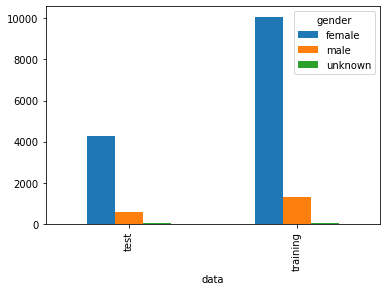

In [ ]:
# Plotting gender distribution across training and test sets
pd.DataFrame.from_dict(test_results['doc_amounts']).pivot(columns = 'gender', index = 'data', values = 'doc_amount').plot(kind = 'bar')

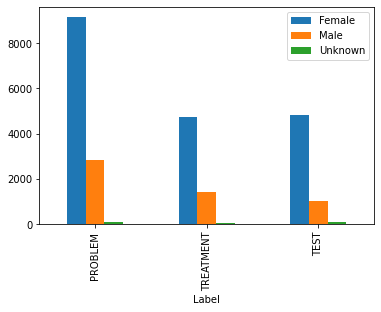

In [ ]:
# Plotting gender distribution for each entity in training set
test_results['training_set_gender_distribution'].plot(x='Label', kind = 'bar')

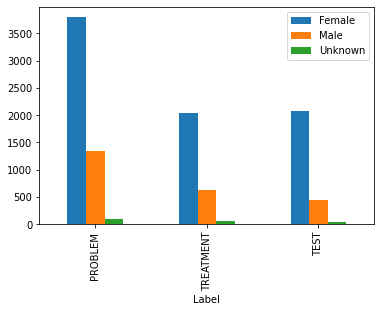

In [ ]:
# Plotting gender distribution for each entity in test set
test_results['test_set_gender_distribution'].plot(x='Label', kind = 'bar')

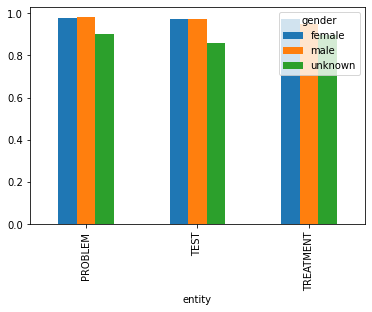

In [ ]:
# Plotting f1 scores for each entity for each gender
test_results['test_set_metrics'].pivot(columns = 'gender', index = 'entity', values = 'f1').plot(kind = 'bar')

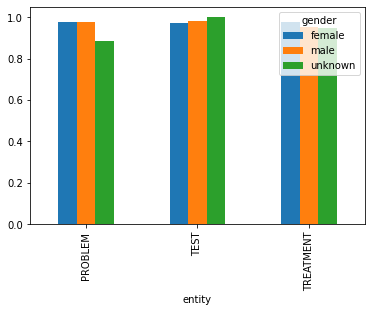

In [ ]:
# Plotting precision scores for each entity for each gender
test_results['test_set_metrics'].pivot(columns = 'gender', index = 'entity', values = 'precision').plot(kind = 'bar')

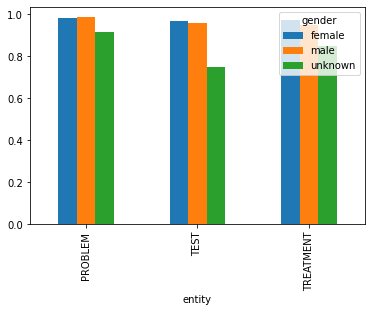

In [ ]:
# Plotting recall scores for each entity for each gender
test_results['test_set_metrics'].pivot(columns = 'gender', index = 'entity', values = 'recall').plot(kind = 'bar')

#### Step 4: Conceive Mitigation Strategies

The idea here is that we have noticed that our sentences are heavily biased towards females. This could be an issue down the line when deploying the model in real-world settings where patient distributions might not reflect this distribution. The good news, however is that the f1, precision and recall scores don't seem too affected by this bias.

To address this potential bias, we can purposefully add additional annotations of sentences or documents for males in our training set.

## Noisy Labels

In this example, we will be testing a clinical CoNLL dataset's noisy labels. The idea here is to find the errors that data annotators may have potentially made during the annotation process and take steps towards correcting them. The real-world project workflow of the noisy label testing and fixing goes as follows:

1. Test noisy labels on original CoNLL training set

2. Fix noisy labels interactively

#### Step 1: Testing Noisy Labels on CoNLL

In [ ]:
from sparknlp_jsl.nlp_test import find_label_errors

clinical_embeddings = WordEmbeddingsModel.pretrained('embeddings_clinical', "en", "clinical/models")\
    .setInputCols(["sentence", "token"])\
    .setOutputCol("embeddings")

ner_graph_builder = TFGraphBuilder()\
    .setModelName("ner_dl")\
    .setInputCols(["sentence", "token", "embeddings"]) \
    .setLabelColumn("label")\
    .setGraphFolder("medical_ner_graphs")\
    .setGraphFile("auto")\
    .setHiddenUnitsNumber(20)\
    .setIsMedical(True)

# Make sure to add setIncludeAllConfidenceScores(True)
nerTagger = MedicalNerApproach()\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setLabelColumn("label")\
    .setOutputCol("ner")\
    .setMaxEpochs(20)\
    .setBatchSize(32)\
    .setRandomSeed(0)\
    .setVerbose(1)\
    .setValidationSplit(0)\
    .setEvaluationLogExtended(True) \
    .setEnableOutputLogs(True)\
    .setIncludeConfidence(True)\
    .setIncludeAllConfidenceScores(True)\
    .setOutputLogsPath('ner_logs')\
    .setUseBestModel(True)\
    .setEarlyStoppingCriterion(0.04)\
    .setEarlyStoppingPatience(3)\
    .setGraphFolder("medical_ner_graphs")\
   .setEnableMemoryOptimizer(True)

training_pipeline = Pipeline(stages=[
          clinical_embeddings,
          ner_graph_builder,
          nerTagger
 ])

# Run noisy labels test
result_df = find_label_errors(spark = spark,
                              training_pipeline = training_pipeline,
                              conll_path = 'medical_data.conll',
                              k = 4,
                              threshold = 0.9)

# Save results
result_df.to_csv('noisy_labels_results.csv', index=False)

#### Step 2: Fixing Noisy Labels

In [ ]:
# Load results from previous run of find_label_errors (threshold was set to 0.1 in this run)
result_df = pd.read_csv('noisy_labels_results.csv')

In [ ]:
result_df = pd.read_csv('result_medical.csv')

In [ ]:
from sparknlp_jsl.nlp_test import InteractiveFix

fix_app = InteractiveFix(result_df)
fix_app.display()

HTML(value='\n        <style> \n.header {\n  background-color:#0098DA;\n  margin:0;\n  text-align: center;\n}\…

AppLayout(children=(GridspecLayout(children=(HTML(value='\n            <div class="table_title">\n            …

In [ ]:
# Will apply all flags and label replacements to the new file.
fix_app.apply_fixes(conll_path = 'medical_data.conll', 
                    save_path = 'medical_data_fixed_labels.conll')

When displaying the first 25 rows, we notice several errors in the annotated dataset:

- "take PO liquids" was annotated as a TREATMENT, whereas the correct annotation span should be "PO liquids"
- "On physical examination" was annotated as a TEST, whereas the correct annotation span should be "physical examination"
- "bands." was annotated as a TEST, but it does not seem to require any annotation
- "word finding difficulty." was annotated as a PROBLEM, but the punctuation mark "." should not be included in the annotation, as suggested by the error score